In [1]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation
from IPython.display import HTML

from joblib import Parallel, delayed

In [2]:
def Hamiltonian(L, J0, Delta, A, V, g):

    H = np.zeros((2 * L, 2 * L), dtype=complex)
    
    # --- Sample --- #

    for i in range(L):
        H[i, (i + 1) % L] = -J0 * np.exp(1j * A)
        H[(i + 1) % L, i] = -J0 * np.exp(-1j * A)
        
        if i % 2 == 0:
            H[i, i] = Delta
        else:
            H[i, i] = -Delta

    # --- Probe --- #

    for i in range(L):
        
        H[i + L, i + L] = V

    # --- Coupling --- #
    
    for i in range(L):
        H[i, i + L] = g
        H[i + L, i] = g

    return H

def H0(L, J0, Delta):

    H = np.zeros((L, L), dtype=complex)
    
    # --- Sample --- #

    for i in range(L):
        H[i, (i + 1) % L] = -J0 
        H[(i + 1) % L, i] = -J0
        
        if i % 2 == 0:
            H[i, i] = Delta
        else:
            H[i, i] = -Delta
            
    return H

def C0(L, J0, Delta, N_occ):

    H = H0(L, J0, Delta)
    eigvals, eigvecs = np.linalg.eigh(H)

    # Occupy the lowest N_occ states
    occupied_states = eigvecs[:, :N_occ]

    # Construct the correlation matrix
    C_0 = occupied_states @ occupied_states.conj().T
    
    return C_0

def simulation(C0, A, Probe, J0, Delta, V, times):

    L = C0.shape[0]

    C_ij = np.zeros((2*L, 2*L, len(times)), dtype=np.complex64) 

    C_ij[:, :, 0] = np.block([[C0, np.zeros((L, L))], [np.zeros((L, L)), np.zeros((L, L))]])
        
    for t in range(1, len(times)):
            
        dt = times[t] - times[t-1]
            
        H = Hamiltonian(L, J0, Delta, A[t], V, g=Probe[t])

        eigvals, eigvecs = np.linalg.eigh(H)
        U = eigvecs @ np.diag(np.exp(-1j * eigvals * dt)) @ np.linalg.inv(eigvecs)

        C_ij[:, :, t] = U @ C_ij[:, :, t-1] @ U.conj().T

    return C_ij

def entropy(rho, cut, tol=1e-6):

    rho_cut = rho[:cut, :cut]
    
    eigvals = np.linalg.eigvals(rho_cut)
    eigvals = np.real(eigvals)  # Ensure eigenvalues are real
    
    eigvals = np.clip(eigvals, tol, 1.0)  # Clip eigenvalues to avoid log(0) issues

    S = -np.sum(eigvals * np.log(eigvals))
    return S

def Green_function(psi_occ, J0, Delta, A, Probe, w, times):

    L = psi_occ.shape[0]
    N_occ = psi_occ.shape[1]
    N_t = times.shape[0]

    psi_t = np.zeros((2*L, N_occ, N_t), dtype=complex)

    psi_t[:L, :, 0] = psi_occ

    G_ij = np.zeros((2*L, 2*L, N_t), dtype=complex)

    G_ij[:, :, 0] = psi_t[:, :, 0] @ psi_t[:, :, 0].conj().T

    for t in range(1, N_t):

        dt = times[t] - times[t-1]

        H_t = Hamiltonian(L, J0, Delta, A[t], V=w, g=Probe[t])

        eigvals_t, eigvecs_t = np.linalg.eigh(H_t)

        U = eigvecs_t @ np.diag(np.exp(-1j * eigvals_t * dt)) @ eigvecs_t.conj().T

        psi_t[:, :, t] = U @ psi_t[:, :, t-1]

        G_ij[:, :, t] = psi_t[:, :, t] @ psi_t[:, :, 1].conj().T

    return G_ij

def folding(n_w_t_k, k, a):
    
    N_omega, N_t, N_k = n_w_t_k.shape

    fold_param = np.pi / a
    n_w_t_k_folded = np.zeros((N_omega, N_t, N_k), dtype=float)

    # Fold k values into the first Brillouin zone #
    
    k_folded = (k + fold_param) % (2 * fold_param) - fold_param 

    # Find index of folded k matching original k and populates n_w_t_k_folded #

    for i in range(len(k)):
        target = np.argmin(np.abs(k - k_folded[i]))
        n_w_t_k_folded[:, :, target] += n_w_t_k[:, :, i] 

    # Crop k axis (remove indeces outside 1st Brillouin zone) #

    k_idx = np.where(np.max(n_w_t_k_folded[:, -1, :], axis=0) > 1e-6)[0] # Check which k values have non-zero spectral weight
    kmin = k_idx[0] # Define min cutoff
    kmax = k_idx[-1] # Define max cutoff

    k_folded = k_folded[kmin:kmax+1] # Crop k axis 

    n_w_t_k_folded = n_w_t_k_folded[:, :, kmin:kmax+1] # Crop n_w_t_k_folded

    return k_folded, n_w_t_k_folded

def visualise_matrix(H, cmap='Greys', figsize=(12,5)):
    # Construct subplots for real and imaginary parts of Hamiltonian matrix
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Real part
    im_real = axes[0].imshow(H.real, cmap=cmap)
    axes[0].set_title('Real Part')
    axes[0].set_xlabel('Column')
    axes[0].set_ylabel('Row')
    plt.colorbar(im_real, ax=axes[0])
    
    # Imaginary part
    im_imag = axes[1].imshow(H.imag, cmap=cmap)
    axes[1].set_title('Imaginary Part')
    axes[1].set_xlabel('Column')
    axes[1].set_ylabel('Row')
    plt.colorbar(im_imag, ax=axes[1])
    
    fig.suptitle('Matrix visualization for (16x16) Hamiltonian')
    plt.show()

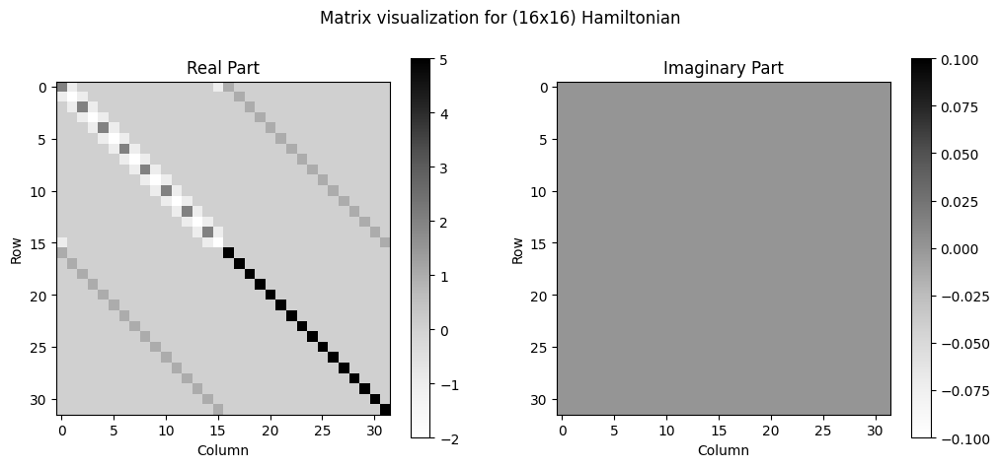

In [5]:
################
# --- test --- #
################

L = 16
t = 0

J0 = 1.0
Delta = 2.0
A0 = 0.0

V = 5.0
g = 1.0

H = Hamiltonian(L, J0, Delta, A0, V, g)
visualise_matrix(H)


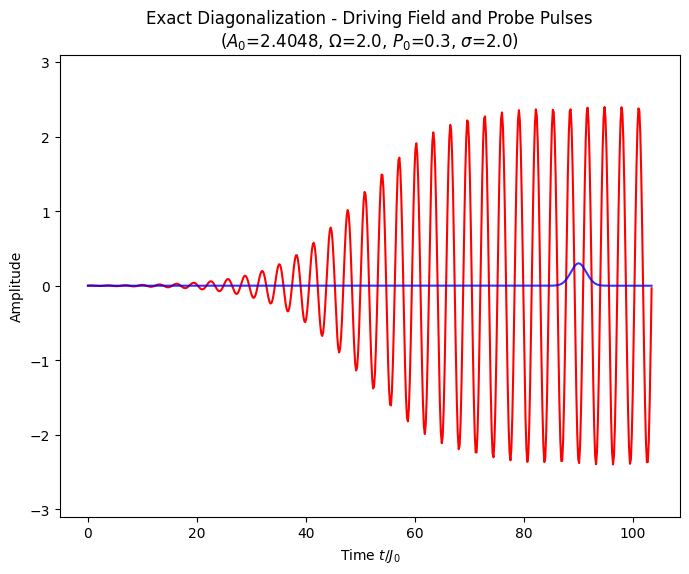

In [ ]:
L = 64

N_t = 600
times = np.linspace(0.0, 103.4, N_t)

N_omega = 100
omega_scan = np.linspace(-6.0, 6.0, N_omega)

J0 = 1.0
Delta = 0.0

A0 = 2.4048255576957727686216318793264546431242449091459671357069990905
T = np.pi
omega = 2 * np.pi / T

t0 = 50.0
delta = 15.0

P0 = 0.3
t_probe = 90.0
sigma = 2.0


A = A0 / 2 * (1 + np.tanh((times - t0) / delta)) * np.sin(omega * (times - t0))


#Probe = P0 * ( np.exp(-(times - 10.0)**2 / (sigma**2)) + np.exp(-(times - 30.0)**2 / (sigma**2)) + np.exp(-(times - 50.0)**2 / (sigma**2)) + np.exp(-(times - 70.0)**2 / (sigma**2)) + np.exp(-(times - 90.0)**2 / (sigma**2)) )

Probe = P0 * np.exp(-(times - t_probe)**2 / (sigma**2))

plt.figure(figsize=(8, 6))
plt.plot(times, A, color='red', label='A(t)')
plt.plot(times, Probe, color='blue', alpha=0.8, label=r'P(t)')
plt.xlabel(r"Time $t/J_0$")    
plt.ylabel(r'Amplitude')
plt.title(r'Exact Diagonalization - Driving Field and Probe Pulses' + '\n' + r'($A_0$={:.5}, $\Omega$={:.1f}, $P_0$={:.1f}, $\sigma$={:.3})'.format(A0, omega, P0, sigma))
plt.ylim(-3.1, 3.1)

plt.show()

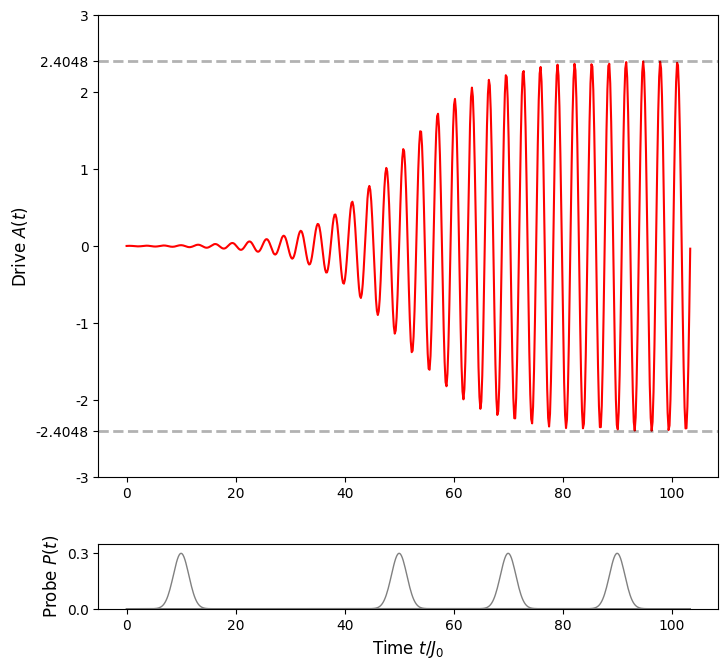

In [4]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.figure(figsize=(8, 6))
ax_main = plt.gca()

plt.plot(times, A, color='red', label=r'$A(t)$')
 
plt.ylabel(r'Drive $A(t)$', fontsize=12)
#plt.title(r'Energy Spectrum - Exact Diagonalization' + '\n' + r'($A_0$={:.5}, $\Omega$={:.1f}, $P_0$={:.1f}, $\sigma$={:.3})'.format(A0, omega, P0, sigma))

# Horizontal lines to indicate probe pulse positions
plt.axhline(y=2.4048255576957727686216318793264546431242449091459671357069990905,  color='black', alpha=0.3, linestyle='--', linewidth=2)
plt.axhline(y=-2.4048255576957727686216318793264546431242449091459671357069990905, color='black', alpha=0.3, linestyle='--', linewidth=2)

A0_val = A0
current_ticks = np.array([-3, -2, -1, 0, 1, 2, 3])
new_ticks = np.sort(np.concatenate([current_ticks, [A0_val, -A0_val]]))

# Create custom labels - integers without decimals, A0 value with decimals
labels = []
for tick in new_ticks:
    if tick in current_ticks:  # Integer ticks
        labels.append(f'{int(tick)}')
    else:  # A0 value
        labels.append(f'{tick:.4f}')

plt.yticks(new_ticks, labels)


# Add inset axes at the bottom showing only the probe pulse
ax_inset = inset_axes(ax_main, width="100%", height="40%", loc='lower center',
                       bbox_to_anchor=(0.0, -0.3, 1.0, 0.35), 
                       bbox_transform=ax_main.transAxes)


Probe_0 = P0 * np.exp(-(times - 10.0)**2 / (sigma**2))
Probe_2 = P0 * np.exp(-(times - 50.0)**2 / (sigma**2))
Probe_3 = P0 * np.exp(-(times - 70.0)**2 / (sigma**2))
Probe_4 = P0 * np.exp(-(times - 90.0)**2 / (sigma**2))

ax_inset.plot(times, Probe_0, color='gray', linewidth=1)
ax_inset.plot(times, Probe_2, color='gray', linewidth=1)
ax_inset.plot(times, Probe_3, color='gray', linewidth=1)
ax_inset.plot(times, Probe_4, color='gray', linewidth=1)
ax_inset.set_xlabel(r'Time $t/J_0$', fontsize=12)
ax_inset.set_ylabel(r'Probe $P(t)$', fontsize=12)
ax_inset.set_ylim(0.0, 0.35)
ax_inset.set_yticks([0.0, 0.3])

plt.show()

In [19]:
H_0 = H0(L, J0, Delta)

filling = L

C_0 = C0(L, J0, Delta, N_occ=filling)

C_ij = Parallel(n_jobs=-1, verbose=10)(delayed(simulation)(C_0, A, Probe, J0, Delta, w, times) for w in omega_scan)

print("Saving to array...")

C_ij = np.array(C_ij, dtype=np.complex64)  # Shape: (N_omega, 2L, 2L, N_t)

print("C_ij.shape:", C_ij.shape)

print("Calculating momentum distribution...")
# Selects probe block
C_probe = C_ij[:, L:, L:, :]  # Shape: (N_omega, L, L, N_t)

k = np.linspace(-np.pi, np.pi, L, endpoint=False)
l = np.arange(0, L)  # Site indices
phase_factor = np.exp(-1j * np.outer(k, l)) / np.sqrt(L)  # Phase factor for Fourier transform

n_w_t_k = np.zeros((N_omega, N_t, L), dtype=float)

for w in range(N_omega):
    for t in range(N_t):
        n_w_t_k[w, t, :] = np.abs(np.diag(phase_factor @ C_probe[w, :, :, t] @ phase_factor.conj().T))

print("Post-processing completed!")

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  88 out of 100 | elapsed:  3.0min remaining:   24.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.3min finished


Saving to array...
C_ij.shape: (100, 128, 128, 600)
Calculating momentum distribution...
Post-processing completed!


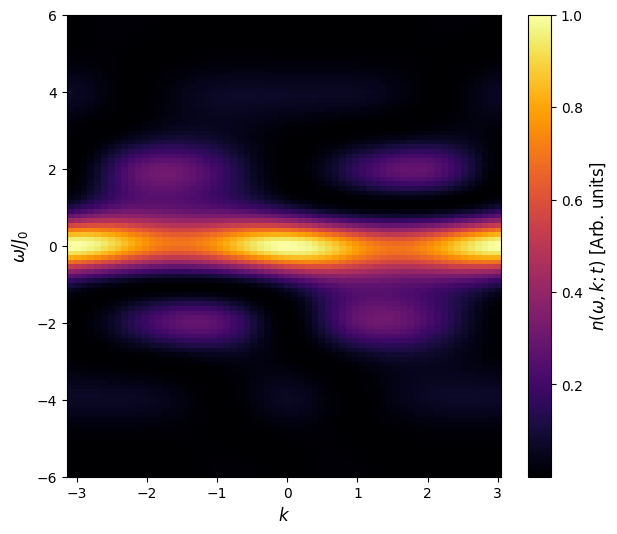

In [20]:
#k_folded, n_w_t_k_folded = folding(n_w_t_k, k, a=2.0)

plt.figure(figsize=(7, 6))
plt.imshow(
    n_w_t_k[:, -1, :] / np.max(n_w_t_k[:, -1, :]),  # Normalize to max value for better color scaling
    extent=[k[0], k[-1], omega_scan[0], omega_scan[-1]],
    aspect='auto',
    cmap='inferno',
    origin='lower'
)

#e_k = np.zeros_like(k)  # Assuming e_k is zero for all k in this test case

#for n in range(-2, 3):  # Plot several Floquet replicas
#    plt.plot(k, e_k + n * omega, color='gray', alpha=0.8, linestyle='--')

cbar = plt.colorbar(label=r'$n(\omega, t_{final}, k)$')
cbar.set_label(r'$n(\omega, k; t)$ [Arb. units]', fontsize=12)

plt.xlabel(r'$k$', fontsize=12)
plt.ylabel(r'$\omega / J_0$', fontsize=12)
#plt.title('ED PBC - 1st Brillouin Zone Energy Spectrum at Final Time' + '\n' + r'($J_0$={}, $A_0$={:.5}, $\Omega$={:.1f}, $P_0$={}, $t_{{probe}}$={:.3}, $\sigma$={:.3})'.format(J0, A0, omega, P0, t_probe, sigma))
plt.show()

In [45]:
max = np.max(n_w_t_k)
min = np.min(n_w_t_k)

# Set up the figure and axis for animation 
fig, ax = plt.subplots(figsize=(8, 6)) 
im = ax.imshow(n_w_t_k[:, 0, :], extent=[np.min(k)/np.pi, np.max(k)/np.pi, omega_scan[0], omega_scan[-1]], aspect='auto', origin='lower', cmap='inferno', vmin=min, vmax=max) 
plt.colorbar(im, ax=ax, label=r'$n(k, \omega, t)$')
plt.title(
    'ED PBC - 1st Brillouin Zone Energy Spectrum at Final Time' 
    + '\n' + 
    r'($J_0$={}, $\Delta$={}, $A_0$={:.5}, $\Omega$={:.1f}, $P_0$={}, $t_{{probe}}$={:.3}, $\sigma$={:.3})'.format(J0, Delta, A0, omega, P0, t_probe, sigma)) 
ax.set_xlabel('k / π') 
ax.set_ylabel('ω / J') 

# Animation update function 
def update(frame): 
    im.set_data(n_w_t_k[:, frame, :]) 
    ax.set_title(
        f'ED PBC - 1st Brillouin Zone Energy Spectrum at t= {np.round(times[frame], 2)}' 
        + '\n' + 
        r'($J_0$={}, $\Delta$={}, $A_0$={:.5}, $\Omega$={:.1f}, $P_0$={}, $t_{{probe}}$={:.3}, $\sigma$={:.3})'.format(J0, Delta, A0, omega, P0, t_probe, sigma))
    return [im] 

ani = animation.FuncAnimation(fig, update, frames=N_t, blit=True) 
plt.rcParams['animation.embed_limit'] = 800 # in MB, so 800 MB limit 
plt.close(fig) 
HTML(ani.to_jshtml())